<p style="font-family:'Segoe UI';font-size:20px;color:white;background-color:purple"><br><b>Assignment on DecisionTreeClassifier</b><br><br>
Student name: Muhammad Iqbal Bazmi<br><br></p>

#### importing necessary libraries

In [1]:
import warnings
warnings.filterwarnings("ignore") # Ignore the Warnings

import sqlite3  # Lite database
import pandas as pd # Data processing
import numpy as np # Numerical Processing
import nltk # Natural Language Toolkit
import string # for strong processing
import matplotlib.pyplot as plt
import seaborn as sns # For visualization top on Matplotlib

# Text pre-processing using TFIDF concept
# TFIDF => Term Frequency- Inverse Document Frequency
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

# Text processing using BOW (Bag Of Words)
from sklearn.feature_extraction.text import CountVectorizer

# Metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Stemming of word using PorterStemmer 
from nltk.stem.porter import PorterStemmer
# Lemmatization of word using WordNetLemmatizer
from nltk.stem.wordnet import WordNetLemmatizer

# regular expression
import re

# stopwords
from nltk.corpus import stopwords


# Gensim models ###############
###############################

# change word to dense Vector
from gensim.models import Word2Vec
from gensim.models import KeyedVectors

# to save the variable
import pickle

# to visualize the processing 
from tqdm import tqdm

# operating system operation
import os

# Visualizations
from chart_studio import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

# Counter
from collections import Counter

## 1. Loading Data

In [129]:
data  = pd.read_csv('preprocessed_data.csv', nrows=10000)
# data  = pd.read_csv('preprocessed_data.csv', nrows=50000) # you can take less number of rows like this
# I have preprocessed 50000 datapoints but it is taking a lot of time when using BOW, and TFIDF. so , finally, I decide to use 
# just 10K datapoints because of I have resource constrained laptop.
# Thanks in advance to understand
data.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,nv,ms,grades_prek_2,26,1,literacy_language,literacy,Most of my kindergarten students come from low...,299.98
1,ga,mrs,grades_3_5,1,0,music_arts_health_sports,performingarts_teamsports,Our elementary school is a culturally rich sch...,20.00


In [130]:
class_distribution = dict(data['project_is_approved'].value_counts())
class_distribution

{1: 8510, 0: 1490}

Text(0.5, 1.0, 'Distribution of classes')

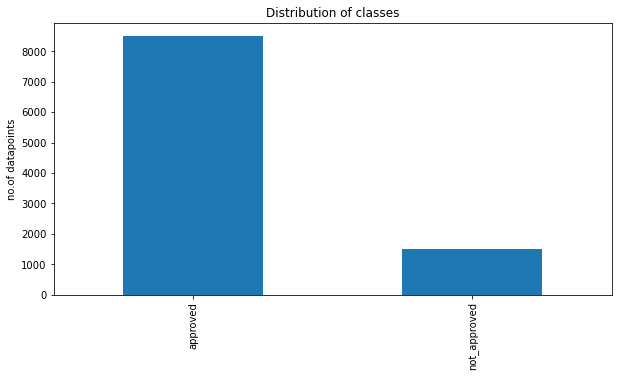

In [131]:
plt.figure(figsize=(10,5))
data['project_is_approved'].value_counts().plot(kind='bar')
plt.xticks([0,1],['approved','not_approved'])
plt.ylabel('no.of datapoints')
plt.title('Distribution of classes')

## 1.2 Splitting into Train and Test dataset

In [132]:
x_columns = list(data.columns)
x_columns.remove('project_is_approved')

In [133]:
x_columns

['school_state',
 'teacher_prefix',
 'project_grade_category',
 'teacher_number_of_previously_posted_projects',
 'clean_categories',
 'clean_subcategories',
 'essay',
 'price']

In [134]:
# X = data[x_columns].values
# Y = data['project_is_approved'].values
# Y = Y.reshape(-1,1)

In [135]:
# X.shape , Y.shape

In [136]:
# importing necessary libraries
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data[x_columns], data['project_is_approved'], test_size=0.2, random_state=42)

In [137]:
type(X_train)

pandas.core.frame.DataFrame

# 2. Vectorizing Text data
**For both Train and Test**

## 2.1 Bag of words

In [138]:
preprocessed_essays_train = X_train['essay'].values
preprocessed_essays_test  = X_test['essay'].values

In [139]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
text_bow_train = vectorizer.fit_transform(preprocessed_essays_train)
text_bow_test  = vectorizer.transform(preprocessed_essays_test)
print("Shape of train matrix after one hot encodig ",text_bow_train.shape)
print("Shape of test matrix after one hot encoding ", text_bow_test.shape)

Shape of train matrix after one hot encodig  (8000, 5752)
Shape of test matrix after one hot encoding  (2000, 5752)


In [140]:
# you can vectorize the title also 
# before you vectorize the title make sure you preprocess it

## 2.2 TFIDF vectorizer

In [141]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
text_tfidf_train = vectorizer.fit_transform(preprocessed_essays_train)
text_tfidf_test = vectorizer.transform(preprocessed_essays_test)
print("Shape of matrix of train data after TFIDF encodig ",text_tfidf_train.shape)
print("Shape of matrix of test data after TFIDF encoding", text_tfidf_test.shape)

Shape of matrix of train data after TFIDF encodig  (8000, 5752)
Shape of matrix of test data after TFIDF encoding (2000, 5752)


## 2.3 Using Pretrained Models: Avg W2V

In [142]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [143]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

Avg W2V for Train data

In [144]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list of train dataset
for sentence in tqdm(preprocessed_essays_train): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_train.append(vector)

print(len(avg_w2v_vectors_train))
print(len(avg_w2v_vectors_train[0])) # vector size

100%|████████████████████████████████████████████████████████████████████████████| 8000/8000 [00:04<00:00, 1663.86it/s]

8000
300


AVG W2V for the test dataset

In [145]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list of train dataset
for sentence in tqdm(preprocessed_essays_test): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)

print(len(avg_w2v_vectors_test))
print(len(avg_w2v_vectors_test[0])) # vector size

100%|█████████████████████████████████████████████████████████████████████████████| 2000/2000 [00:02<00:00, 969.09it/s]

2000
300


## 2.4 Using Pretrained Models: TFIDF weighted W2V

In [146]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [147]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_train): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_train.append(vector)

print(len(tfidf_w2v_vectors_train))
print(len(tfidf_w2v_vectors_train[0]))

100%|█████████████████████████████████████████████████████████████████████████████| 8000/8000 [00:50<00:00, 158.61it/s]

8000
300


In [148]:
# average Word2Vec for test dataset
# compute average word2vec for each review.
tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_test): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_test.append(vector)

print(len(tfidf_w2v_vectors_test))
print(len(tfidf_w2v_vectors_test[0]))

100%|█████████████████████████████████████████████████████████████████████████████| 2000/2000 [00:12<00:00, 158.37it/s]

2000
300


# 2. Vectorizing Categorical Features

In [149]:
# Vectorizing 'school_state' feature
vectorizer = CountVectorizer(binary=True)
school_state_ohe_train = vectorizer.fit_transform(X_train['school_state'].values)
school_state_ohe_test  = vectorizer.transform(X_test['school_state'].values)
print("Shape of matrix of 'school_state' of train dataset after one hot encodig ",school_state_ohe_train.shape)
print("Shape of matrix of 'school_state' of test dataset after one hot encoding",school_state_ohe_test.shape)

Shape of matrix of 'school_state' of train dataset after one hot encodig  (8000, 51)
Shape of matrix of 'school_state' of test dataset after one hot encoding (2000, 51)


In [150]:
# vectorizing 'teacher_prefix'
vectorizer = CountVectorizer(binary=True)
teacher_prefix_ohe_train = vectorizer.fit_transform(X_train['teacher_prefix'].values)
teacher_prefix_ohe_test = vectorizer.transform(X_test['teacher_prefix'].values)
print("teacher_prefix_ohe**********************")
print("Shape of matrix of train dataset after one hot encoding ",teacher_prefix_ohe_train.shape)
print("Shape of matrix of test dataset after one hot encoding ",teacher_prefix_ohe_test.shape)

teacher_prefix_ohe**********************
Shape of matrix of train dataset after one hot encoding  (8000, 5)
Shape of matrix of test dataset after one hot encoding  (2000, 5)


In [151]:
# vectorizing 'project_grade_category'
vectorizer = CountVectorizer(binary=True)
project_grade_category_ohe_train = vectorizer.fit_transform(X_train['project_grade_category'].values)
project_grade_category_ohe_test  = vectorizer.transform(X_test['project_grade_category'].values)

print("project_grade_category_ohe")
print("Shape of matrix of train data after one hot encoding ",project_grade_category_ohe_train.shape)
print("Shape of matrix of test data after one hot encoding",project_grade_category_ohe_test.shape)

project_grade_category_ohe
Shape of matrix of train data after one hot encoding  (8000, 4)
Shape of matrix of test data after one hot encoding (2000, 4)


In [152]:
# vectorizing 'clean_categories'
vectorizer = CountVectorizer(binary=True)
clean_categories_ohe_train = vectorizer.fit_transform(X_train['clean_categories'].values)
clean_categories_ohe_test  = vectorizer.transform(X_test['clean_categories'].values)

print('clean_categories_ohe')
print("Shape of matrix of train data after one hot encoding :",clean_categories_ohe_train.shape)
print("Shape of matrix of test data after one-hot encoding :",clean_categories_ohe_test.shape)

clean_categories_ohe
Shape of matrix of train data after one hot encoding : (8000, 47)
Shape of matrix of test data after one-hot encoding : (2000, 47)


In [153]:
# vectorizing 'clean_subcategories'
vectorizer = CountVectorizer(binary=True)
clean_subcategories_ohe_train = vectorizer.fit_transform(X_train['clean_subcategories'].values)
clean_subcategories_ohe_test  = vectorizer.transform(X_test['clean_subcategories'].values)

print("clean_subcategories_ohe")
print("Shape of matrix of train data after one hot encodig ",clean_subcategories_ohe_train.shape)
print("Shape of matrix of test data after one hot encoding : ",clean_subcategories_ohe_test.shape)

clean_subcategories_ohe
Shape of matrix of train data after one hot encodig  (8000, 275)
Shape of matrix of test data after one hot encoding :  (2000, 275)


### Let's calculate Sentiment scores of essay

    sentiment scores of preprocessed_essays_train (Training dataset)

In [154]:
# a random essay example of train dataset
preprocessed_essays_train[0]

'My students are a wonderful and exciting group of 4-5 year-old boys and girls in an ICT (integrated collaborative teaching) classroom. This means that 40% of my students are in special education, and the rest are in general education. \\r\\n\\r\\nWe are a Title I school and work hard to ensure that everyone learns and succeeds. I want them to have everything they need to make their school year exciting and fun, as well as productive and successful throughout the entire school year.My students are wonderful and deserve an amazing classroom. Fadeless paper and border will allow me to dress up the classrooms bulletin boards in a way that students will love. Colorful paper and border will help make the classroom bright and cheerful so that we can display the students work throughout the year. Tape will allow me to hang learning charts and student work on the walls throughout the classroom for the students to see and be proud of. Glue will be a great resource for use during art projects an

In [155]:
len(preprocessed_essays_train) # no.of essays

8000

<pre>Let's start finding sentiment scores

In [156]:
import nltk # Natural Language ToolKit library
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\localadmin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [157]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

sentiment_list_train = [] # list to store sentiments
for i in tqdm(range(len(preprocessed_essays_train))): # for every essay in preprocessed_essays
    essay = preprocessed_essays_train[i]
    
    ss = sid.polarity_scores(essay)
    
    temp = [] # temporary list to store all four columns['neg','neutral','pos','compound']
    
    for k in ss:
        temp.append(ss[k])
        
    sentiment_list_train.append(temp) 

100%|█████████████████████████████████████████████████████████████████████████████| 8000/8000 [00:34<00:00, 232.75it/s]


In [158]:
# an example of sentiment score
sentiment_list_train[0]

[0.006, 0.697, 0.297, 0.9964]

In [159]:
sentiment_list_array_train = np.array(sentiment_list_train)

In [160]:
sentiment_list_array_train.shape

(8000, 4)

    sentiment scores of preprocessed_essays_test (Test dataset)

In [161]:
# a random essay example of train dataset
preprocessed_essays_test[0]

"Approximately 60% of the students at our school receive free or reduced-price lunch, and we have a high number of military families. There is an amazing group of hardworking young adults in this class. They strive every day to do their best and succeed. Their goals and dreams are to achieve a high school diploma and go to college. These students take any obstacle in their path head-on and don't let it slow them down. These students overcome so many different setbacks during their time in school.This project holds a special place in the hearts of our student green team. They work hard each week to promote recycling within our school and community. The student green team is requesting a new recycling bin with lid so that we can add a bin to our office area to help collect bottles and cans. They are also requesting recycling bags to place in our bins to make collection easier and faster for the team. Finally the students would like a table to use as a place for our student green team mee

In [162]:
len(preprocessed_essays_test) # no.of essays

2000

<pre>Let's start finding sentiment scores

In [163]:
import nltk # Natural Language ToolKit library
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\localadmin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [164]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

sentiment_list_test = [] # list to store sentiments
for i in tqdm(range(len(preprocessed_essays_test))): # for every essay in preprocessed_essays
    essay = preprocessed_essays_test[i]
    
    ss = sid.polarity_scores(essay)
    
    temp = [] # temporary list to store all four columns['neg','neutral','pos','compound']
    
    for k in ss:
        temp.append(ss[k])
        
    sentiment_list_test.append(temp) 

100%|█████████████████████████████████████████████████████████████████████████████| 2000/2000 [00:08<00:00, 227.07it/s]


In [165]:
# an example of sentiment score
sentiment_list_test[0]

[0.02, 0.846, 0.134, 0.9792]

In [166]:
sentiment_list_array_test = np.array(sentiment_list_test)

In [167]:
sentiment_list_array_test.shape

(2000, 4)

### Creating training and test dataset1:
<pre>
containing TFIDF(text)

##### Creating Train

In [168]:
# creating dataset using numpy horizontal stacking method 'hstack()'
X_train1= np.hstack(   
    (school_state_ohe_train.toarray(),
    teacher_prefix_ohe_train.toarray(),
    project_grade_category_ohe_train.toarray(),
    X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1),
    clean_categories_ohe_train.toarray(),
    clean_subcategories_ohe_train.toarray(),
    text_tfidf_train.toarray(),
    X_train['price'].values.reshape(-1,1),
    sentiment_list_array_train # sentiment score
    )
)
y_train1 = y_train.values.reshape(-1,1)

In [169]:
X_train1.shape

(8000, 6140)

In [170]:
y_train1.shape

(8000, 1)

##### Creating test dataset

In [171]:
# creating dataset using numpy horizontal stacking method 'hstack()'
X_test1= np.hstack(   
    (school_state_ohe_test.toarray(),
    teacher_prefix_ohe_test.toarray(),
    project_grade_category_ohe_test.toarray(),
    X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1),
    clean_categories_ohe_test.toarray(),
    clean_subcategories_ohe_test.toarray(),
    text_tfidf_test.toarray(),
    X_test['price'].values.reshape(-1,1),
    sentiment_list_array_test # sentiment score
    )
)
y_test1 = y_test.values.reshape(-1,1)

In [172]:
X_test1.shape

(2000, 6140)

In [173]:
y_test1.shape

(2000, 1)

### Creating dataset2:
<pre>Containing TFIDF W2V</pre>

##### Train dataset

In [174]:
X_train2= np.hstack(   
    (school_state_ohe_train.toarray(),
    teacher_prefix_ohe_train.toarray(),
    project_grade_category_ohe_train.toarray(),
    X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1),
    clean_categories_ohe_train.toarray(),
    clean_subcategories_ohe_train.toarray(),
    np.array(tfidf_w2v_vectors_train),
    X_train['price'].values.reshape(-1,1),
    sentiment_list_array_train # sentiment score
    )
)
y_train2 = y_train.values.reshape(-1,1)

In [175]:
X_train2.shape

(8000, 688)

In [176]:
y_train2.shape

(8000, 1)

##### Test dataset

In [177]:
# creating dataset using numpy horizontal stacking method 'hstack()'
X_test2= np.hstack(   
    (school_state_ohe_test.toarray(),
    teacher_prefix_ohe_test.toarray(),
    project_grade_category_ohe_test.toarray(),
    X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1),
    clean_categories_ohe_test.toarray(),
    clean_subcategories_ohe_test.toarray(),
    np.array(tfidf_w2v_vectors_test),
    X_test['price'].values.reshape(-1,1),
    sentiment_list_array_test # sentiment score
    )
)
y_test2 = y_test.values.reshape(-1,1)

In [178]:
X_test2.shape

(2000, 688)

In [179]:
y_test2.shape

(2000, 1)

<pre>
<h2 style="color:red">Task-1</h2>
1.<b>Apply Decision Tree Classifier on above datasets (set1 and set2).</b>
<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
         <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
</ol>
</pre>


<pre><h2 style="color:red">SET 2</h2>

In [180]:
from sklearn.tree import DecisionTreeClassifier

<pre><b>Hyper parameter tuning on the dataset to find 'depth' and 'min_samples_split'</b></pre>

In [181]:
depth = [1,5,10,15] # list of depth parameters 
min_samples_split = [5,10,100,500] # list of minimum samples split

In [182]:
from sklearn.model_selection import GridSearchCV # GridSearchCV for cross validation

In [183]:
clf_set2 = DecisionTreeClassifier(class_weight='balanced') # initializing Classifier

In [184]:
# making the dictionary of parameters
param_grid = dict(max_depth = depth, min_samples_split=min_samples_split)

In [185]:
from sklearn.model_selection import KFold # importing KFold
kfold = KFold(n_splits=10, random_state=42) # initializing object of 10-fold cross-validation

In [186]:
# performing GridSearchCV using 'roc_auc' scoring and also parallelizing the task using n_jobs=-1
grid_search2 = GridSearchCV(clf_set2, param_grid,scoring='roc_auc',n_jobs=-1, cv=kfold)

In [187]:
grid_search2.return_train_score=True # making train score true to get train score

In [188]:
%%time 
# %%time to track the time taken to fit the classifier
grid_result2 = grid_search2.fit(X_train2,y_train2)

Wall time: 2min 22s


> **best parameters**

In [189]:
# best parameter
grid_result2.best_params_

{'max_depth': 5, 'min_samples_split': 500}

<p style="font-family:'Segoe UI';background-color:purple;color:white;font-size:16px"><b>We get best parameters as:</b> <br>
    1. max_depth = 15 <br>
    2. min_samples_split = 500

In [190]:
# best score
grid_result2.best_score_

0.5686008250325683

<pre style="color:blue"><b>Tracing the mean and standard deviation test score of auc_score for each hyper parameter

In [191]:
means2 = grid_result2.cv_results_['mean_test_score']
stds2 = grid_result2.cv_results_['std_test_score']
params2 = grid_result2.cv_results_['params']

In [192]:
for mean, stdev, param in zip(means2, stds2, params2):
    print("mean = ",mean," stddev = ",stdev," param = ",param)

mean =  0.5437583515741204  stddev =  0.018509841223056357  param =  {'max_depth': 1, 'min_samples_split': 5}
mean =  0.5437583515741204  stddev =  0.018509841223056357  param =  {'max_depth': 1, 'min_samples_split': 10}
mean =  0.5437583515741204  stddev =  0.018509841223056357  param =  {'max_depth': 1, 'min_samples_split': 100}
mean =  0.5437583515741204  stddev =  0.018509841223056357  param =  {'max_depth': 1, 'min_samples_split': 500}
mean =  0.5547804362039349  stddev =  0.017665713550407282  param =  {'max_depth': 5, 'min_samples_split': 5}
mean =  0.5546323723773358  stddev =  0.017751099781224484  param =  {'max_depth': 5, 'min_samples_split': 10}
mean =  0.5571421161702835  stddev =  0.017508860723733  param =  {'max_depth': 5, 'min_samples_split': 100}
mean =  0.5686008250325683  stddev =  0.018623287281580622  param =  {'max_depth': 5, 'min_samples_split': 500}
mean =  0.5518549495937768  stddev =  0.02952521056017626  param =  {'max_depth': 10, 'min_samples_split': 5}
mea

### Plot the result in 3d using plotly

In [193]:
import plotly.offline as offline # to use plotly in offline model
import plotly.graph_objs as go # importing graph objects
offline.init_notebook_mode()  # initialize plotly in notebook mode
import numpy as np

In [194]:
grid_result2.cv_results_ # see the complete description of findings

{'mean_fit_time': array([0.86609674, 0.6266048 , 0.63082769, 0.62009501, 2.40593555,
        2.30777938, 2.29098277, 2.1453953 , 3.77244093, 4.3548799 ,
        5.33894441, 4.09401059, 6.7840169 , 6.36183434, 6.09581497,
        4.66123316]),
 'std_fit_time': array([0.18105722, 0.0281852 , 0.01923413, 0.03078112, 0.02214053,
        0.05533389, 0.01865646, 0.05255246, 0.14452757, 0.50697027,
        0.297709  , 0.33451408, 0.30338171, 0.41387165, 0.33598626,
        0.30161769]),
 'mean_score_time': array([0.00807586, 0.00684342, 0.00755446, 0.00581055, 0.00559952,
        0.00399988, 0.00399992, 0.00720053, 0.0055994 , 0.0071995 ,
        0.00959969, 0.0103987 , 0.01279118, 0.01205451, 0.01249611,
        0.00736756]),
 'std_score_time': array([0.00315038, 0.00375117, 0.00239686, 0.00251082, 0.00366575,
        0.00399988, 0.00399992, 0.00240018, 0.00366567, 0.00239983,
        0.00598573, 0.00366397, 0.01265006, 0.00562968, 0.01032573,
        0.00201948]),
 'param_max_depth': masked

In [195]:
x1_set2 = list(grid_result2.cv_results_['param_min_samples_split'])
y1_set2 = list(grid_result2.cv_results_['param_max_depth'])
z1_set2 = list(grid_result2.cv_results_['mean_train_score']) # accuracy on X_train

x2_set2 = list(grid_result2.cv_results_['param_min_samples_split'])
y2_set2 = list(grid_result2.cv_results_['param_max_depth'])
z2_set2 = list(grid_result2.cv_results_['mean_test_score'])

In [196]:
x1_set2, y1_set2, z1_set2

([5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500],
 [1, 1, 1, 1, 5, 5, 5, 5, 10, 10, 10, 10, 15, 15, 15, 15],
 [0.5520393802542105,
  0.5520393802542105,
  0.5520393802542105,
  0.5520393802542105,
  0.6920910955676214,
  0.6919793034372005,
  0.683790198310094,
  0.6590938132492127,
  0.8813861693776428,
  0.8767151735430619,
  0.8106400941157773,
  0.7055037505848805,
  0.9567331993989345,
  0.9517479089106805,
  0.861556599744277,
  0.7188707134388606])

In [197]:
# https://plot.ly/python/3d-axes/
trace12 = go.Scatter3d(x=x1_set2,y=y1_set2,z=z1_set2, name = 'train')
trace22 = go.Scatter3d(x=x2_set2,y=y2_set2,z=z2_set2, name = 'Cross validation')
data2 = [trace12, trace22]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data2, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

### Let's plot the heatmap 

In [198]:
# creating utility function for plotting heatmap
def plot_heatmap(dataframe, title="Title", xlabel="xlabel", ylabel="ylabel"):
    sns.heatmap(
        data=dataframe,
        annot=True,
        xticklabels=dataframe.columns,
        yticklabels=dataframe.index,
        cmap='Blues',
        fmt='g'
    )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

# creating dataset
def dataset_creation(data, index, columns):
    t=np.array(data).reshape(len(index),len(columns))
    
    dataset = pd.DataFrame(t,
                         index=index,
                         columns=columns
                        )
    return dataset

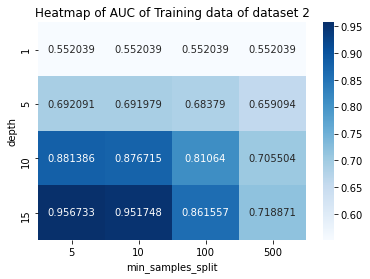

In [199]:
# creating a dataset to plot heatmap of training dataset of set2
train_data_set2 = dataset_creation(z1_set2, index = depth, columns=min_samples_split)

# print(train_data_set1)
# plotting the heatmap
plot_heatmap(
    train_data_set2, 
    title='Heatmap of AUC of Training data of dataset 2',
    xlabel='min_samples_split',
    ylabel='depth'
)

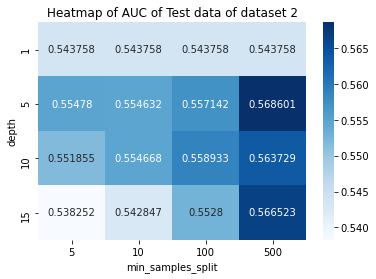

In [200]:
# creating a dataset to plot heatmap of training dataset of set2
test_data_set2 = dataset_creation(z2_set2, index = depth, columns=min_samples_split)

# plotting the heatmap
plot_heatmap(
    test_data_set2, 
    title='Heatmap of AUC of Test data of dataset 2',
    xlabel='min_samples_split',
    ylabel='depth'
)

<pre><p style="color:#22f;font-family:'Segoe UI';font-size:15px"> Once after you found the best hyper-parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.

**finding best parameter**

In [201]:
best_parameter2 = grid_result2.best_params_

In [202]:
best_parameter2

{'max_depth': 5, 'min_samples_split': 500}

**Initializing Classifier**

In [203]:
from sklearn.multiclass import OneVsOneClassifier

In [204]:
# used OneVsOneClassifier to get y_score using decision_function()
best_clf2 = OneVsOneClassifier(DecisionTreeClassifier(max_depth=best_parameter2['max_depth'], min_samples_split=best_parameter2['min_samples_split'],
                                                     class_weight='balanced'))

**fitting classifier**

In [205]:
y_score2 = best_clf2.fit(X_train2,y_train2).decision_function(X_test2)
# actually it is score given by decision function

In [206]:
x_score2 = best_clf2.decision_function(X_train2)
# score of training dataset by decision function

In [207]:
# help(auc) ############# uncomment to see the description of auc ############

In [208]:
y_test2.shape # shape of dependent variable

(2000, 1)

In [209]:
y_score2.shape

(2000,)

In [210]:
x_score2.shape

(8000,)

In [211]:
# y_score1 # uncomment this to see the result

In [212]:
# getting fpr, tpr, and thresholds
fpr2_test, tpr2_test, thresholds2_test = roc_curve(y_test2, y_score2)
# getting fpr, tpr, and thresholds for training data
fpr2_train, tpr2_train, thresholds2_train = roc_curve(y_train2, x_score2)

In [213]:
fpr2_train # showing False positive rate of train dataset

array([0.00000000e+00, 8.47457627e-04, 1.69491525e-03, 1.86440678e-02,
       3.22033898e-02, 6.10169492e-02, 7.11864407e-02, 7.71186441e-02,
       1.31355932e-01, 1.45762712e-01, 1.69491525e-01, 1.95762712e-01,
       2.05932203e-01, 2.33898305e-01, 6.94915254e-01, 7.50847458e-01,
       8.67796610e-01, 9.93220339e-01, 9.95762712e-01, 1.00000000e+00])

In [214]:
tpr2_train # showing True Positive rate of train dataset

array([0.        , 0.01099707, 0.02008798, 0.12668622, 0.19706745,
       0.27140762, 0.2941349 , 0.3058651 , 0.3755132 , 0.39384164,
       0.42346041, 0.45      , 0.45909091, 0.4829912 , 0.83211144,
       0.87360704, 0.95219941, 0.99853372, 0.99912023, 1.        ])

In [215]:
fpr2_test # fpr of test 

array([0.        , 0.00322581, 0.00645161, 0.07741935, 0.10967742,
       0.16129032, 0.16451613, 0.18387097, 0.2516129 , 0.26129032,
       0.27419355, 0.28064516, 0.28387097, 0.29677419, 0.78064516,
       0.80967742, 0.89354839, 1.        , 1.        ])

In [216]:
tpr2_test

array([0.        , 0.00710059, 0.0147929 , 0.11183432, 0.17159763,
       0.25207101, 0.27692308, 0.29112426, 0.3556213 , 0.37633136,
       0.41005917, 0.43550296, 0.44674556, 0.46627219, 0.82426036,
       0.86686391, 0.94852071, 0.99467456, 1.        ])

In [217]:
roc_auc_train2 = auc(fpr2_train, tpr2_train) # getting Area Under Curve of train data
roc_auc_test2  = auc(fpr2_test, tpr2_test) # getting AUC of test data

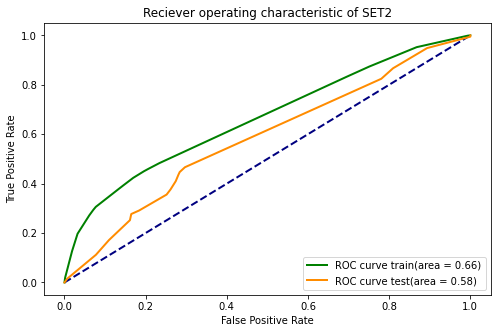

In [218]:
# plotting ROC Curve
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
plt.figure(figsize=(8,5))
plt.plot([0,1],[0,1], color='navy', lw = 2, linestyle='--')
plt.plot(fpr2_train, tpr2_train, color='green', lw=2, label="ROC curve train(area = %0.2f)"%roc_auc_train2)
plt.plot(fpr2_test, tpr2_test, color='darkorange', lw=2, label='ROC curve test(area = %0.2f)'%roc_auc_test2)
plt.title('Reciever operating characteristic of SET2')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")

**print the confusion matrix**

In [219]:
from sklearn.metrics import confusion_matrix

In [220]:
y_predicted2 = best_clf2.predict(X_test2)

Text(0.5, 1.0, 'confusion matrix of test data of dataset SET1')

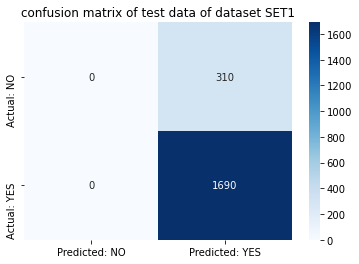

In [221]:
cm2 = confusion_matrix(y_test2, y_predicted2)
xlabels = ['Predicted: NO', 'Predicted: YES']
ylabels = ['Actual: NO', 'Actual: YES']
sns.heatmap(
    data=cm2,
    xticklabels=xlabels,
    yticklabels=ylabels,
    annot=True,
    fmt='g',
    cmap='Blues'
)
plt.title('confusion matrix of test data of dataset SET1')

#### Getting False positive datapoints of SET1...

In [222]:
# getting false positive data to plot the WordCloud
fp_essay2 = [] # list to store false positive data from the training dataset
fp_price2 = [] # to store price of False positive
fp_teacher_project_posted2= [] # to store teacher_number_of_previously_posted_projects

for i in tqdm(range(len(y_test2))): # for each datapoint in test dataset
    
    if y_test2[i]==0 and y_predicted2[i]==1: # checking for false positive
        
        fp_essay2.append(X_test['essay'].iloc[i]) # appending the essay of desired location
        fp_price2.append(X_test['price'].iloc[i]) # appending price
        fp_teacher_project_posted2.append(X_test['teacher_number_of_previously_posted_projects'].iloc[i])
        

100%|███████████████████████████████████████████████████████████████████████████| 2000/2000 [00:00<00:00, 57367.03it/s]


In [223]:
len(fp_essay2)

310

In [224]:
fp_essay2[0:2]

['The students in my classroom come from quite a diverse group of backgrounds and academic abilities. Ninety-percent of our student body receives free and reduced price breakfast/lunch. Many students come from time-poor families, meaning their parents or guardians are unable to spend much quality time with them to help them with their homework. Over years of being in this situation, the achievement gap between them and their higher SES peers widens.\\r\\nDespite the high poverty level and the obstacles that face them, my students come to school ready to learn and work hard. What they lack in grade level academic achievement, they make up for in heart and character. Our school has a hyphenated name because we are a hyphenated community. Half of our building is composed of general education K-4 classrooms, while the other half consists of self-contained classrooms for students with various disabilities. My students participate in a program called \\"Project Unify\\" in which they take tu

In [225]:
# importing necessary modules
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)

comment_words2 = ''
for essay in fp_essay2: # for each essay
    # joining all essays into single variable called comment_words
    essay = essay + ' ' # adding space at the end of sentence.
    comment_words2 += "".join(essay)+""
    


In [226]:
comment_words2[0:100]

'The students in my classroom come from quite a diverse group of backgrounds and academic abilities. '

### WordCloud

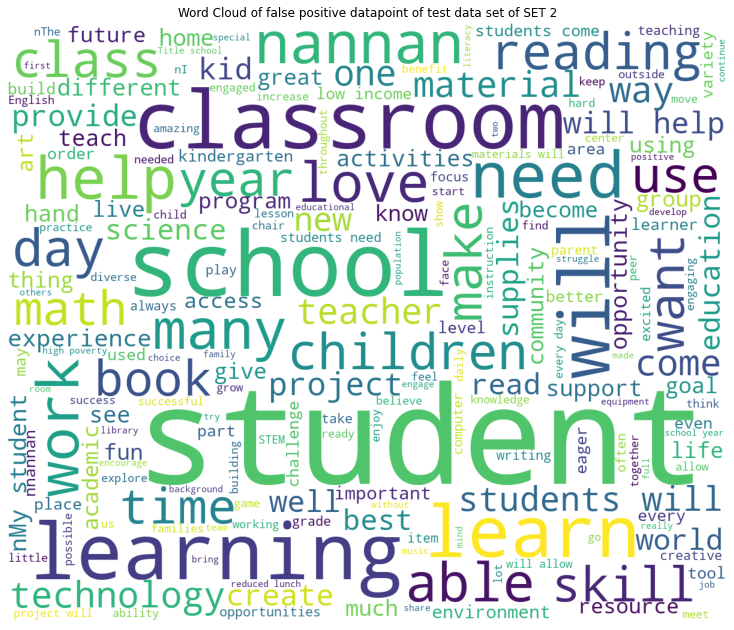

In [227]:
wordcloud2 = WordCloud(width=1200, height=1000,
                     background_color='white',
                     stopwords = stopwords,
                     min_font_size = 10
                     ).generate(comment_words2)

plt.figure(figsize=(10,10), facecolor=None)
plt.imshow(wordcloud2)
plt.axis(False)
plt.tight_layout(pad=0)
plt.title('Word Cloud of false positive datapoint of test data set of SET 2')
plt.show()

### Box-plot

#### Plot the box plot with the 'price' of these false positive data points'

Text(0.5, 1.0, 'Box plot of price of false positive data points of SET2')

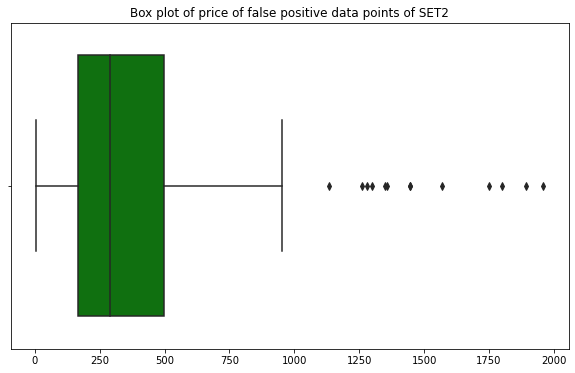

In [228]:
plt.figure(figsize=(10,6))
sns.boxplot(fp_price2,color='green')
plt.title('Box plot of price of false positive data points of SET2')

### PDF(Porbability Density Function)

Text(0, 0.5, 'Probability density')

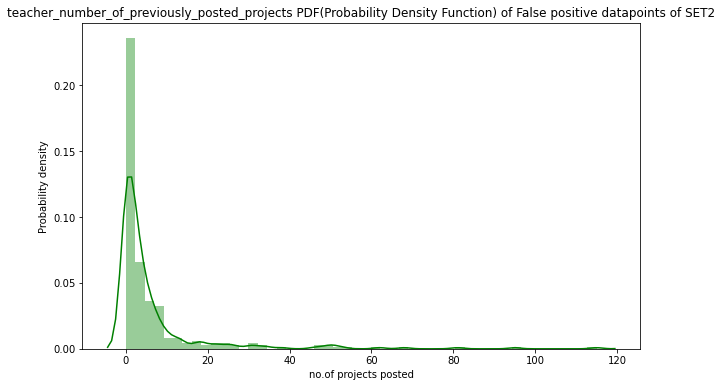

In [229]:
plt.figure(figsize=(10,6))
sns.distplot(fp_teacher_project_posted2,
            color='green',
        )
plt.title('teacher_number_of_previously_posted_projects PDF(Probability Density Function) of False positive datapoints of SET2')
plt.xlabel('no.of projects posted')
plt.ylabel('Probability density')


<pre><h2 style="color:red">SET 1</h2>

In [230]:
from sklearn.tree import DecisionTreeClassifier

<pre><b>Hyper parameter tuning on the dataset to find 'depth' and 'min_samples_split'</b></pre>

In [231]:
depth = [1,5,10,15] # list of depth parameters 
min_samples_split = [5,10,100,500] # list of minimum samples split

In [232]:
from sklearn.model_selection import GridSearchCV # GridSearchCV for cross validation

In [233]:
clf_set1 = DecisionTreeClassifier(class_weight='balanced') # initializing Classifier

In [234]:
# making the dictionary of parameters
param_grid = dict(max_depth = depth, min_samples_split=min_samples_split)

In [235]:
from sklearn.model_selection import KFold # importing KFold
kfold = KFold(n_splits=10, random_state=42) # initializing object of 10-fold cross-validation

In [236]:
# performing GridSearchCV using 'roc_auc' scoring and also parallelizing the task using n_jobs=-1
grid_search1 = GridSearchCV(clf_set1, param_grid,scoring='roc_auc',n_jobs=-1, cv=kfold)

In [237]:
grid_search1.return_train_score=True # making train score true to get train score

In [238]:
X_train1.shape, y_train1.shape

((8000, 6140), (8000, 1))

In [239]:
X_test1.shape, y_test1.shape

((2000, 6140), (2000, 1))

In [119]:
# let's save the dataset for further use using Dask framerwork
# because it is difficult to fit into memory
# pd.DataFrame(X_train1).to_csv('X_train1.csv',index=False)
# pd.DataFrame(y_train1).to_csv('y_train1.csv',index=False)
# pd.DataFrame(X_test1).to_csv('X_test1.csv',index=False)
# pd.DataFrame(y_test1).to_csv('y_test1.csv',index=False)

In [120]:
# import dask.dataframe as dd

In [121]:
# X_train1 = dd.read_csv('X_train1.csv',)
# y_train1 = dd.read_csv('y_train1.csv')
# X_test1 = dd.read_csv('X_test1.csv')
# y_test1 = dd.read_csv('y_test1.csv')

In [240]:
%%time 
# %%time to track the time taken to fit the classifier
grid_result1 = grid_search1.fit(X_train1,y_train1) # it will take very long time,

Wall time: 21min 21s


> **best parameters**

In [241]:
# best parameter
grid_result1.best_params_

{'max_depth': 5, 'min_samples_split': 500}

<p style="font-family:'Segoe UI';background-color:purple;color:white;font-size:16px"><b>We get best parameters as:</b> <br>
    1. max_depth = 10 <br>
    2. min_samples_split = 5

In [242]:
# best score
grid_result1.best_score_

0.611862390790589

<pre style="color:blue"><b>Tracing the mean and standard deviation test score of auc_score for each hyper parameter

In [243]:
means1 = grid_result1.cv_results_['mean_test_score']
stds1 = grid_result1.cv_results_['std_test_score']
params1 = grid_result1.cv_results_['params']

In [244]:
for mean, stdev, param in zip(means1, stds1, params1):
    print("mean = ",mean," stddev = ",stdev," param = ",param)

mean =  0.5333632575686382  stddev =  0.020480885563178543  param =  {'max_depth': 1, 'min_samples_split': 5}
mean =  0.5333632575686382  stddev =  0.020480885563178543  param =  {'max_depth': 1, 'min_samples_split': 10}
mean =  0.5333632575686382  stddev =  0.020480885563178543  param =  {'max_depth': 1, 'min_samples_split': 100}
mean =  0.5333632575686382  stddev =  0.020480885563178543  param =  {'max_depth': 1, 'min_samples_split': 500}
mean =  0.6115706902303784  stddev =  0.025625111962890038  param =  {'max_depth': 5, 'min_samples_split': 5}
mean =  0.6109908761322314  stddev =  0.025514683637779107  param =  {'max_depth': 5, 'min_samples_split': 10}
mean =  0.6096877684610952  stddev =  0.02511952963391889  param =  {'max_depth': 5, 'min_samples_split': 100}
mean =  0.611862390790589  stddev =  0.02404907718490784  param =  {'max_depth': 5, 'min_samples_split': 500}
mean =  0.5916837440086538  stddev =  0.027551632062225495  param =  {'max_depth': 10, 'min_samples_split': 5}
me

### Plot the result in 3d using plotly

In [245]:
import plotly.offline as offline # to use plotly in offline model
import plotly.graph_objs as go # importing graph objects
offline.init_notebook_mode()  # initialize plotly in notebook mode
import numpy as np

In [246]:
grid_result1.cv_results_ # see the complete description of findings

{'mean_fit_time': array([11.00319858,  7.06102128,  6.62656646,  6.55857553, 26.70664766,
        32.78893604, 28.84695308, 24.6396862 , 40.45973177, 41.41908832,
        44.66792932, 39.80487278, 47.48352504, 48.98964305, 47.6044157 ,
        40.99921353]),
 'std_fit_time': array([2.97932103, 0.58256113, 0.32149003, 0.15112147, 1.25524744,
        3.48329675, 2.27188713, 1.00880796, 2.27733208, 3.20624277,
        1.02425432, 3.00112902, 1.90177469, 2.93218425, 1.39440218,
        3.18923165]),
 'mean_score_time': array([0.14148436, 0.06318259, 0.06159482, 0.05439382, 0.06309071,
        0.09051127, 0.06388378, 0.0611546 , 0.04780338, 0.06345003,
        0.07367349, 0.06159453, 0.05706539, 0.06479409, 0.06399434,
        0.05279486]),
 'std_score_time': array([0.07289424, 0.01353376, 0.0051219 , 0.02524596, 0.01488537,
        0.01436958, 0.00936062, 0.00707476, 0.00613127, 0.00652725,
        0.02198905, 0.01189194, 0.01060653, 0.01617633, 0.01959464,
        0.01483679]),
 'param_ma

In [247]:
x1_set1 = list(grid_result1.cv_results_['param_min_samples_split'])
y1_set1 = list(grid_result1.cv_results_['param_max_depth'])
z1_set1 = list(grid_result1.cv_results_['mean_train_score']) # accuracy on X_train

x2_set1 = list(grid_result1.cv_results_['param_min_samples_split'])
y2_set1 = list(grid_result1.cv_results_['param_max_depth'])
z2_set1 = list(grid_result1.cv_results_['mean_test_score'])

In [248]:
x1_set1, y1_set1, z1_set1

([5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500, 5, 10, 100, 500],
 [1, 1, 1, 1, 5, 5, 5, 5, 10, 10, 10, 10, 15, 15, 15, 15],
 [0.5466810032869895,
  0.5466810032869895,
  0.5466810032869895,
  0.5466810032869895,
  0.685006896020924,
  0.6847640791921089,
  0.6787988268597542,
  0.6639068360769576,
  0.8329633164009895,
  0.8293817135387078,
  0.7897284774183136,
  0.7282654988923862,
  0.9141117814220723,
  0.9078683440122772,
  0.8438710755644874,
  0.7521561804543327])

In [249]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1_set1,y=y1_set1,z=z1_set1, name = 'train')
trace2 = go.Scatter3d(x=x2_set1,y=y2_set1,z=z2_set1, name = 'Cross validation')
data1 = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data1, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

### Let's plot the heatmap 

In [250]:
# creating utility function for plotting heatmap
def plot_heatmap(dataframe, title="Title", xlabel="xlabel", ylabel="ylabel"):
    sns.heatmap(
        data=dataframe,
        annot=True,
        xticklabels=dataframe.columns,
        yticklabels=dataframe.index,
        cmap='Blues',
        fmt='g'
    )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

# creating dataset
def dataset_creation(data, index, columns):
    t=np.array(data).reshape(len(index),len(columns))
    
    dataset = pd.DataFrame(t,
                         index=index,
                         columns=columns
                        )
    return dataset

         5         10        100       500
1   0.546681  0.546681  0.546681  0.546681
5   0.685007  0.684764  0.678799  0.663907
10  0.832963  0.829382  0.789728  0.728265
15  0.914112  0.907868  0.843871  0.752156


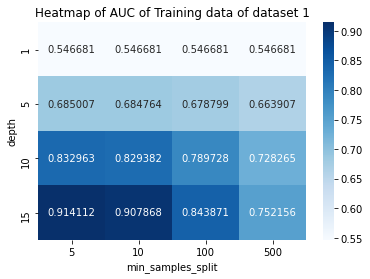

In [251]:
# creating a dataset to plot heatmap of training dataset of set2
train_data_set1 = dataset_creation(z1_set1, index = depth, columns=min_samples_split)

print(train_data_set1)
# plotting the heatmap
plot_heatmap(
    train_data_set1, 
    title='Heatmap of AUC of Training data of dataset 1',
    xlabel='min_samples_split',
    ylabel='depth'
)

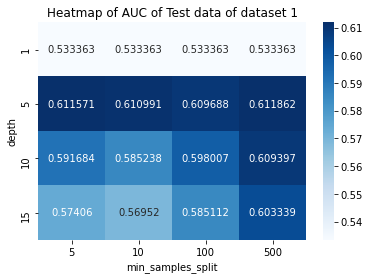

In [252]:
# creating a dataset to plot heatmap of training dataset of set2
test_data_set1 = dataset_creation(z2_set1, index = depth, columns=min_samples_split)

# plotting the heatmap
plot_heatmap(
    test_data_set1, 
    title='Heatmap of AUC of Test data of dataset 1',
    xlabel='min_samples_split',
    ylabel='depth'
)

<pre><p style="color:#22f;font-family:'Segoe UI';font-size:15px"> Once after you found the best hyper-parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.

**finding best parameter**

In [253]:
best_parameter1 = grid_result1.best_params_

In [254]:
best_parameter1

{'max_depth': 5, 'min_samples_split': 500}

**Initializing Classifier**

In [255]:
from sklearn.multiclass import OneVsOneClassifier

In [256]:
# used OneVsOneClassifier to get y_score using decision_function()
best_clf1 = OneVsOneClassifier(DecisionTreeClassifier(max_depth=best_parameter1['max_depth'], min_samples_split=best_parameter1['min_samples_split'],
                                                     class_weight='balanced'))

**fitting classifier**

In [257]:
y_score1 = best_clf1.fit(X_train1,y_train1).decision_function(X_test1)
# actually it is score given by decision function

In [258]:
x_score1 = best_clf1.decision_function(X_train1)
# score of training dataset by decision function

In [259]:
# help(auc) ############# uncomment to see the description of auc ############

In [260]:
y_test1.shape # shape of dependent variable

(2000, 1)

In [261]:
y_score1.shape

(2000,)

In [262]:
x_score1.shape

(8000,)

In [263]:
# y_score1 # uncomment this to see the result

In [264]:
# getting fpr, tpr, and thresholds
fpr1_test, tpr1_test, thresholds1_test = roc_curve(y_test1, y_score1)
# getting fpr, tpr, and thresholds for training data
fpr1_train, tpr1_train, thresholds1_train = roc_curve(y_train1, x_score1)

In [265]:
fpr1_train # showing False positive rate of train dataset

array([0.        , 0.        , 0.00762712, 0.01525424, 0.02542373,
       0.04152542, 0.08983051, 0.18050847, 0.20254237, 0.77288136,
       0.79491525, 0.93813559, 1.        ])

In [266]:
tpr1_train # showing True Positive rate of train dataset

array([0.        , 0.01495601, 0.0585044 , 0.10043988, 0.14384164,
       0.1840176 , 0.29706745, 0.38856305, 0.40938416, 0.91612903,
       0.9313783 , 0.98167155, 1.        ])

In [267]:
fpr1_test # fpr of test 

array([0.        , 0.00645161, 0.01612903, 0.04193548, 0.05806452,
       0.07419355, 0.13548387, 0.21612903, 0.21935484, 0.81290323,
       0.82258065, 0.94516129, 1.        ])

In [268]:
tpr1_test

array([0.        , 0.01242604, 0.05680473, 0.0964497 , 0.14319527,
       0.17455621, 0.27928994, 0.37218935, 0.39408284, 0.9112426 ,
       0.9260355 , 0.97869822, 1.        ])

In [269]:
roc_auc_train = auc(fpr1_train, tpr1_train) # getting Area Under Curve of train data
roc_auc_test  = auc(fpr1_test, tpr1_test) # getting AUC of test data

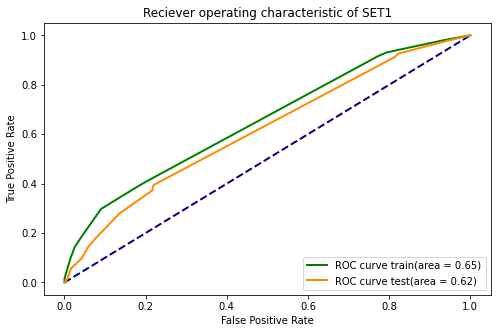

In [270]:
# plotting ROC Curve
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
plt.figure(figsize=(8,5))
plt.plot([0,1],[0,1], color='navy', lw = 2, linestyle='--')
plt.plot(fpr1_train, tpr1_train, color='green', lw=2, label="ROC curve train(area = %0.2f)"%roc_auc_train)
plt.plot(fpr1_test, tpr1_test, color='darkorange', lw=2, label='ROC curve test(area = %0.2f)'%roc_auc_test)
plt.title('Reciever operating characteristic of SET1')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")

**print the confusion matrix**

In [271]:
from sklearn.metrics import confusion_matrix

In [272]:
y_predicted1 = best_clf1.predict(X_test1)

Text(0.5, 1.0, 'confusion matrix of test data of dataset SET1')

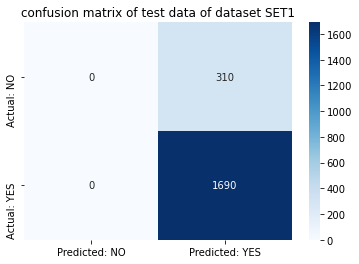

In [273]:
cm1 = confusion_matrix(y_test1, y_predicted1)
xlabels = ['Predicted: NO', 'Predicted: YES']
ylabels = ['Actual: NO', 'Actual: YES']
sns.heatmap(
    data=cm1,
    xticklabels=xlabels,
    yticklabels=ylabels,
    annot=True,
    fmt='g',
    cmap='Blues'
)
plt.title('confusion matrix of test data of dataset SET1')

#### Getting False positive datapoints of SET1...

In [274]:
type(X_train)

pandas.core.frame.DataFrame

In [275]:
# getting false positive data to plot the WordCloud
fp_essay1 = [] # list to store false positive data from the training dataset
fp_price1 = [] # to store price of False positive
fp_teacher_project_posted1= [] # to store teacher_number_of_previously_posted_projects

for i in tqdm(range(len(y_test1))): # for each datapoint in test dataset
    
    if y_test1[i]==0 and y_predicted1[i]==1: # checking for false positive
        
        fp_essay1.append(X_test['essay'].iloc[i]) # appending the essay of desired location
        fp_price1.append(X_test['price'].iloc[i]) # appending price
        fp_teacher_project_posted1.append(X_test['teacher_number_of_previously_posted_projects'].iloc[i])
        

100%|██████████████████████████████████████████████████████████████████████████| 2000/2000 [00:00<00:00, 124865.78it/s]


In [276]:
len(fp_essay1)

310

In [277]:
fp_essay1[0:2]

['The students in my classroom come from quite a diverse group of backgrounds and academic abilities. Ninety-percent of our student body receives free and reduced price breakfast/lunch. Many students come from time-poor families, meaning their parents or guardians are unable to spend much quality time with them to help them with their homework. Over years of being in this situation, the achievement gap between them and their higher SES peers widens.\\r\\nDespite the high poverty level and the obstacles that face them, my students come to school ready to learn and work hard. What they lack in grade level academic achievement, they make up for in heart and character. Our school has a hyphenated name because we are a hyphenated community. Half of our building is composed of general education K-4 classrooms, while the other half consists of self-contained classrooms for students with various disabilities. My students participate in a program called \\"Project Unify\\" in which they take tu

In [278]:
# importing necessary modules
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)

comment_words1 = ''
for essay in fp_essay1: # for each essay
    # joining all essays into single variable called comment_words
    essay = essay + ' ' # adding space at the end of sentence.
    comment_words1 += "".join(essay)+""
    


In [279]:
comment_words1[0:100]

'The students in my classroom come from quite a diverse group of backgrounds and academic abilities. '

### WordCloud

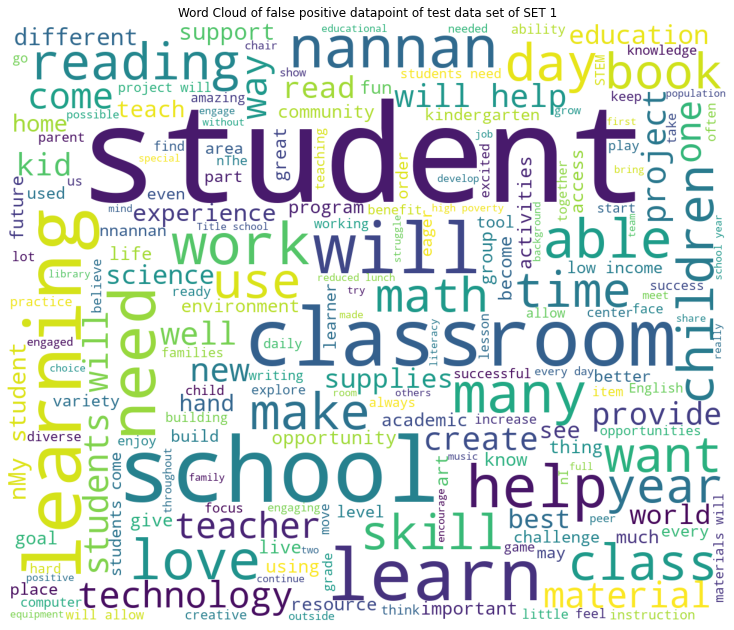

In [280]:
wordcloud1 = WordCloud(width=1200, height=1000,
                     background_color='white',
                     stopwords = stopwords,
                     min_font_size = 10
                     ).generate(comment_words1)

plt.figure(figsize=(10,10), facecolor=None)
plt.imshow(wordcloud1)
plt.axis(False)
plt.tight_layout(pad=0)
plt.title('Word Cloud of false positive datapoint of test data set of SET 1')
plt.show()

### Box-plot

#### Plot the box plot with the 'price' of these false positive data points'

Text(0.5, 1.0, 'Box plot of price of false positive data points of SET1')

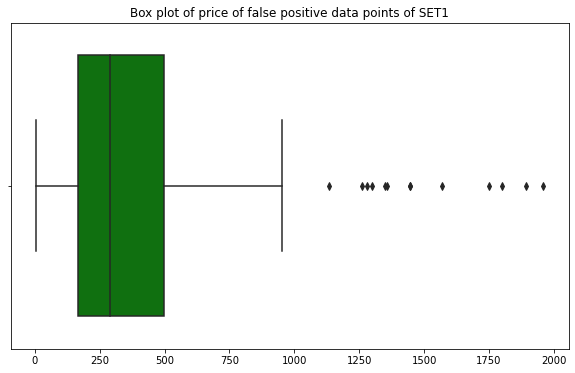

In [281]:
plt.figure(figsize=(10,6))
sns.boxplot(fp_price1,color='green')
plt.title('Box plot of price of false positive data points of SET1')

### PDF(Porbability Density Function)

Text(0, 0.5, 'Probability density')

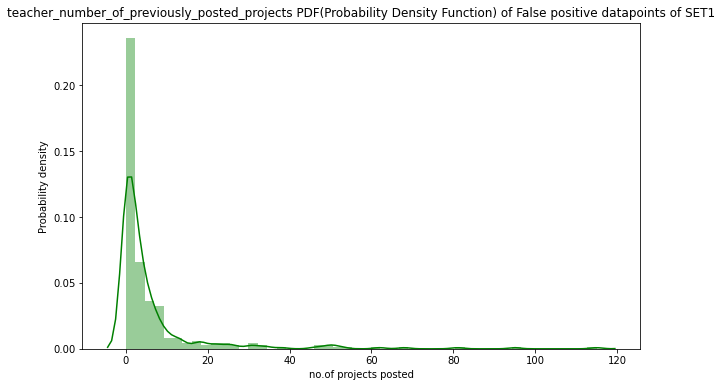

In [282]:
plt.figure(figsize=(10,6))
sns.distplot(fp_teacher_project_posted1,
            color='green',
        )
plt.title('teacher_number_of_previously_posted_projects PDF(Probability Density Function) of False positive datapoints of SET1')
plt.xlabel('no.of projects posted')
plt.ylabel('Probability density')


# <font color='red'><b> Task - 2 </b></font>

For this task consider **set-1** features.

*  Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM).
*  You need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  **Note**: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

In [283]:
grid_result1.best_params_
best_max_depth = grid_result1.best_params_['max_depth']
best_min_split = grid_result1.best_params_['min_samples_split']

In [284]:
clf = DecisionTreeClassifier(max_depth=best_max_depth,
                             min_samples_split=best_min_split,
                             class_weight='balanced'
                            ).fit(X_train1, y_train1)

In [285]:
# get feature importance
important_features = clf.feature_importances_

In [286]:
len(important_features)

6140

In [287]:
important_features

array([0., 0., 0., ..., 0., 0., 0.])

In [288]:
X_train1.shape

(8000, 6140)

In [289]:
non_zero_index = important_features!=0.0

In [290]:
non_zero_index

array([False, False, False, ..., False, False, False])

In [291]:
non_zero_dataset1 = X_train1[:,non_zero_index]

In [292]:
non_zero_dataset1.shape

(8000, 10)

Using Logistic Regression() to classify the new datapoints

In [293]:
from sklearn.linear_model import LogisticRegression

In [294]:
log_clf = LogisticRegression(class_weight='balanced')

In [295]:
kfold = KFold(n_splits=10, random_state=42)

In [296]:
alpha = [100,10,1.0,0.1,0.01]
grid = dict(C=alpha)

grid_search3 = GridSearchCV(estimator=log_clf, param_grid=grid, n_jobs=-1, scoring='roc_auc', cv=kfold)

In [297]:
grid_search3.return_train_score=True # to get train score

In [298]:
grid_result3 = grid_search3.fit(non_zero_dataset1, y_train1)

In [299]:
grid_result3.best_params_

{'C': 10}

In [300]:
grid_result3.best_score_

0.6534313797760514

In [301]:
grid_result3.cv_results_

{'mean_fit_time': array([0.22348568, 0.09359026, 0.07919304, 0.06559398, 0.05919473]),
 'std_fit_time': array([0.15880389, 0.04396622, 0.02827067, 0.00999031, 0.0095982 ]),
 'mean_score_time': array([0.00239983, 0.00399981, 0.00159962, 0.00159976, 0.00319958]),
 'std_score_time': array([0.00366579, 0.00399981, 0.00319924, 0.00319953, 0.00391867]),
 'param_C': masked_array(data=[100, 10, 1.0, 0.1, 0.01],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 100}, {'C': 10}, {'C': 1.0}, {'C': 0.1}, {'C': 0.01}],
 'split0_test_score': array([0.66960536, 0.67907759, 0.67621445, 0.66677801, 0.63360136]),
 'split1_test_score': array([0.66512494, 0.66513711, 0.66288538, 0.6445429 , 0.62037026]),
 'split2_test_score': array([0.66343111, 0.66343111, 0.66341926, 0.66340741, 0.66337185]),
 'split3_test_score': array([0.60361001, 0.60384717, 0.6086693 , 0.62173913, 0.61263505]),
 'split4_test_score': array([0.66308594, 0.66314

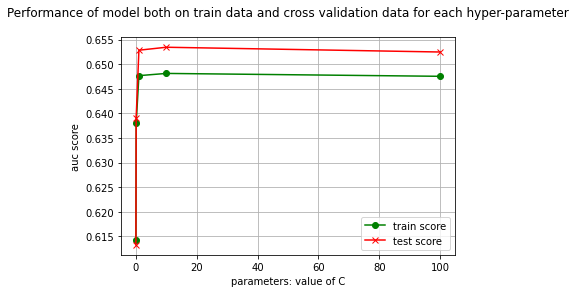

In [302]:
plt.plot(alpha, grid_result3.cv_results_['mean_train_score'],
         color='green', marker='o', label='train score'
        )
plt.plot(alpha, grid_result3.cv_results_['mean_test_score'],
        color='red', label='test score', marker='x',
        )
plt.title('Performance of model both on train data and cross validation data for each hyper-parameter\n')
plt.xlabel('parameters: value of C')
plt.ylabel('auc score')
plt.legend()
plt.grid(True, which='major')
plt.show()

In [303]:
best_log_clf = LogisticRegression(C=grid_result3.best_params_['C'])

In [304]:
best_log_clf.fit(non_zero_dataset1, y_train1)

LogisticRegression(C=10)

In [305]:
non_zero_dataset1_test = X_test1[:,non_zero_index]
y_predicted3 = best_log_clf.predict_proba(non_zero_dataset1_test)

In [306]:
y_score3 = best_log_clf.decision_function(non_zero_dataset1_test)

In [307]:
fpr, tpr, thresh = roc_curve(y_test1, y_score3)

In [308]:
auc_score3 = auc(fpr, tpr)

In [309]:
auc_score3

0.6406241649169688

plot the roc auc

In [310]:
x_score3 = best_log_clf.decision_function(non_zero_dataset1)

In [311]:
fpr3, tpr3, thresh3 = roc_curve(y_train1, x_score3)

In [312]:
auc_score_train3 = auc(fpr3, tpr3)
auc_score_train3

0.6572698071474725

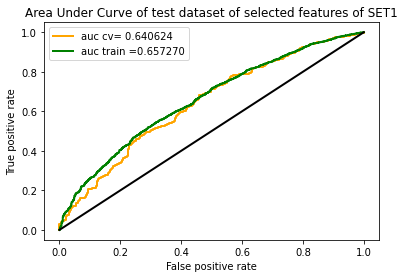

In [313]:
plt.plot(fpr, tpr, color='orange', lw=2, label='auc cv= %f'%auc_score3, animated=True)
plt.plot(fpr3, tpr3, color='green', lw=2, label='auc train =%f'%auc_score_train3, animated=True)
plt.plot([0,1],[0,1], color='black', lw=2, animated=True)
plt.title('Area Under Curve of test dataset of selected features of SET1')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.legend()

<h1 style="font-family:'Segoe UI';color:red">Summary:</h1>

In [314]:
from prettytable import PrettyTable

In [315]:
summary = PrettyTable() # creating object of prettytable

In [316]:
summary.field_names = ["Vectorizer", "Model", "Depth (hyper-parameter)", "min_samples_split","AUC"]

In [317]:
summary.add_row(["TFIDF","DecisionTreeClassifier",grid_result1.best_params_['max_depth'],grid_result1.best_params_['min_samples_split'],"%.2f"%grid_result1.best_score_])
summary.add_row(["TFIDF W2V","DecisionTreeClassifier", grid_result2.best_params_['max_depth'],grid_result2.best_params_['min_samples_split'],"%.2f"%grid_result2.best_score_])

In [318]:
print(summary)

+------------+------------------------+-------------------------+-------------------+------+
| Vectorizer |         Model          | Depth (hyper-parameter) | min_samples_split | AUC  |
+------------+------------------------+-------------------------+-------------------+------+
|   TFIDF    | DecisionTreeClassifier |            5            |        500        | 0.61 |
| TFIDF W2V  | DecisionTreeClassifier |            5            |        500        | 0.57 |
+------------+------------------------+-------------------------+-------------------+------+


In [319]:
summary.add_row(["TFIDF(non-zero features only)","LogisticRegression","No depth (C=%.2f)"%best_log_clf.C,"No height(C=%.2f)"%(best_log_clf.C),"%.2f"%auc_score3])

In [320]:
print(summary)

+-------------------------------+------------------------+-------------------------+--------------------+------+
|           Vectorizer          |         Model          | Depth (hyper-parameter) | min_samples_split  | AUC  |
+-------------------------------+------------------------+-------------------------+--------------------+------+
|             TFIDF             | DecisionTreeClassifier |            5            |        500         | 0.61 |
|           TFIDF W2V           | DecisionTreeClassifier |            5            |        500         | 0.57 |
| TFIDF(non-zero features only) |   LogisticRegression   |    No depth (C=10.00)   | No height(C=10.00) | 0.64 |
+-------------------------------+------------------------+-------------------------+--------------------+------+
